# Data preparation

In [1]:
capital = 10000  # USD $
history_length = 12
# tickers = ["GOOG", "MSFT", "NVDA", "AAPL", "AMZN"]
# tickers = ["AMZN", "MSFT", "AAPL"]
tickers = ["AMZN", "MSFT", "AAPL", "NVDA"]
# tickers = ["GOOG"]a
baseline_weight = {ticker: 1/len(tickers) for ticker in tickers}
baseline_weight

{'AMZN': 0.25, 'MSFT': 0.25, 'AAPL': 0.25, 'NVDA': 0.25}

In [2]:
train_start_date = "1997-05-15"
# start_date = "2016-01-01"

# end_date = "2024-03-31"
train_end_date = "2020-03-31"

val_start_date = train_end_date
# val_end_date = "2021-03-31"
val_end_date = "2024-03-31"


In [3]:
# laod the data
import pandas as pd
data = {}
data_path = "./data/stocks"


for ticker in tickers:
    loaded_data = pd.read_csv(f"{data_path}/{ticker}.csv", index_col=0, parse_dates=True)
    data[ticker] = loaded_data
    
print(data)
data["AMZN"].tail()

{'AMZN':                   Open        High         Low       Close   Adj Close  \
Date                                                                     
1997-05-15    0.121875    0.125000    0.096354    0.097917    0.097917   
1997-05-16    0.098438    0.098958    0.085417    0.086458    0.086458   
1997-05-19    0.088021    0.088542    0.081250    0.085417    0.085417   
1997-05-20    0.086458    0.087500    0.081771    0.081771    0.081771   
1997-05-21    0.081771    0.082292    0.068750    0.071354    0.071354   
...                ...         ...         ...         ...         ...   
2024-03-22  177.750000  179.259995  176.750000  178.869995  178.869995   
2024-03-25  178.009995  180.990005  177.240005  179.710007  179.710007   
2024-03-26  180.149994  180.449997  177.949997  178.300003  178.300003   
2024-03-27  179.880005  180.000000  177.309998  179.830002  179.830002   
2024-03-28  180.169998  181.699997  179.259995  180.380005  180.380005   

                Volume  
Dat

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2024-03-22,177.750000,179.259995,176.750000,178.869995,178.869995,27964100
2024-03-25,178.009995,180.990005,177.240005,179.710007,179.710007,29815500
2024-03-26,180.149994,180.449997,177.949997,178.300003,178.300003,29659000
2024-03-27,179.880005,180.000000,177.309998,179.830002,179.830002,33272600
2024-03-28,180.169998,181.699997,179.259995,180.380005,180.380005,38051600


# preprocess the data

In [4]:
# choose features
dataset = {}
for ticker in tickers:
    # dataset[ticker] = data[ticker][["Close", "Volume"]]
    dataset[ticker] = data[ticker][["Close"]]

### Add Features

In [5]:
# add features - percentage change from previous month which will be our target
# Here we assume that on avrage one month has trading days
prediction_range = 20

for ticker in dataset.keys():
    ticker_data = dataset[ticker]
    ticker_data[f"{prediction_range}-DayChange"] = ticker_data["Close"].pct_change(periods=prediction_range)
    ticker_data = ticker_data.dropna()
    dataset[ticker] = ticker_data

/tmp/ipykernel_148813/929689440.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_data[f"{prediction_range}-DayChange"] = ticker_data["Close"].pct_change(periods=prediction_range)
/tmp/ipykernel_148813/929689440.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_data[f"{prediction_range}-DayChange"] = ticker_data["Close"].pct_change(periods=prediction_range)
/tmp/ipykernel_148813/929689440.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

In [6]:
# add sma feature
sma1 = 25
sma2 = 100
for ticker in dataset.keys():
    ticker_data = dataset[ticker]
    ticker_data[f"SMA_{sma1}"] = ticker_data["Close"].rolling(window=sma1).mean()
    ticker_data[f"SMA_{sma2}"] = ticker_data["Close"].rolling(window=sma2).mean()
    dataset[ticker] = ticker_data

In [7]:
import pandas_ta as ta
# add feature - RSI

for ticker in dataset.keys():
    ticker_data = dataset[ticker]
    ticker_data["RSI_14"] = ta.rsi(ticker_data["Close"], length=14)
    dataset[ticker] = ticker_data

In [8]:
# add feature - MACD

for ticker in dataset.keys():
    ticker_data = dataset[ticker]
    macd_line = ta.macd(ticker_data["Close"])
    ticker_data["MACD line"] = macd_line["MACD_12_26_9"]
    dataset[ticker] = ticker_data

In [9]:
df = pd.concat(dataset.values(), keys=data.keys(), axis=1)
df.reset_index(level=0, inplace=True)
# remove nans
df = df.dropna()
print(df)
print(df.info())

           Date        AMZN                                                  \
                      Close 20-DayChange      SMA_25     SMA_100     RSI_14   
1375 1999-07-14    3.375000     0.398964    2.919188    3.439141  59.227430   
1376 1999-07-15    3.489063     0.249580    2.944750    3.447406  61.648973   
1377 1999-07-16    3.440625     0.218594    2.966438    3.453016  60.018784   
1378 1999-07-19    3.292188     0.183043    2.992313    3.458203  55.201491   
1379 1999-07-20    3.003125    -0.027328    3.020438    3.456985  47.248371   
...         ...         ...          ...         ...         ...        ...   
7588 2024-03-22  178.869995     0.022173  174.846799  157.391100  60.582333   
7589 2024-03-25  179.710007     0.028501  175.254799  157.861100  61.907795   
7590 2024-03-26  178.300003     0.027429  175.703599  158.313200  58.360364   
7591 2024-03-27  179.830002     0.038519  176.153199  158.741500  60.973623   
7592 2024-03-28  180.380005     0.020480  176.385200

In [10]:
#  drop date

# df.drop(columns=["Date"], inplace=True)

In [11]:
# filter out the datafram to only contain one entry per month

df = df.groupby(pd.Grouper(key="Date", freq="M")).first()
df.reset_index(drop=False, inplace=True)

/tmp/ipykernel_148813/635164100.py:3: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df = df.groupby(pd.Grouper(key="Date", freq="M")).first()


In [12]:
df

Date        AMZN                                                  \
                     Close 20-DayChange      SMA_25     SMA_100     RSI_14   
0   1999-07-31    3.375000     0.398964    2.919188    3.439141  59.227430   
1   1999-08-31    2.350000    -0.242318    2.960563    3.411563  36.810357   
2   1999-09-30    2.976563     0.346290    2.653688    3.163969  53.930782   
3   1999-10-31    3.862500     0.286160    3.262313    2.964172  65.023862   
4   1999-11-30    3.456250    -0.103001    3.934937    3.157469  41.466503   
..         ...         ...          ...         ...         ...        ...   
292 2023-11-30  137.000000     0.078740  128.489200  131.869900  60.003627   
293 2023-12-31  147.029999     0.064895  142.127201  135.180301  62.643815   
294 2024-01-31  149.929993     0.019724  149.343199  138.581100  52.886794   
295 2024-02-29  159.279999     0.072809  153.754399  142.383900  60.360117   
296 2024-03-31  178.220001     0.118910  169.314798  150.203300  68.099795   

                     MSFT                           ...        AAPL  \
    MACD line       Close 20-DayChange      SMA_25  ...      SMA_25   
0    0.047060   47.468750     0.222043   43.480000  ...    0.426205   
1   -0.150138   42.406250    -0.078125   45.681250  ...    0.462522   
2    0.115382   46.187500     0.087564   43.511250  ...    0.527500   
3    0.209375   44.992188    -0.019912   46.593438  ...    0.622310   
4    0.019011   46.187500    -0.002026   45.765937  ...    0.625000   
..        ...         ...          ...         ...  ...         ...   
292 -0.081380  346.070007     0.084995  328.487604  ...  174.343202   
293  3.395286  374.510010     0.075189  364.602002  ...  184.159600   
294  2.427522  370.869995    -0.009719  373.660001  ...  193.252800   
295  2.450292  403.779999     0.089530  388.304800  ...  188.333198   
296  4.383234  415.500000     0.029026  408.607998  ...  185.270400   

                                           NVDA                          \
        SMA_100     RSI_14 MACD line      Close 20-DayChange     SMA_25   
0      0.369746  69.908997  0.022539   0.044531     0.257334   0.038409   
1      0.391297  61.183598  0.016524   0.042318     0.045018   0.041779   
2      0.439473  73.853189  0.027001   0.055859     0.353305   0.047951   
3      0.494774  42.840184 -0.009215   0.039844    -0.278293   0.049383   
4      0.544129  59.266868  0.026000   0.048958     0.205120   0.044391   
..          ...        ...       ...        ...          ...        ...   
292  181.806600  49.537912 -1.672039  42.325001    -0.038964  43.555480   
293  181.578901  67.434916  3.496254  46.764999     0.074909  46.694680   
294  182.247801  35.372374  0.782394  48.167999     0.030001  48.022040   
295  183.836600  45.073674 -0.137589  63.027000     0.324960  55.717240   
296  185.775200  35.902767 -2.086485  82.278999     0.305456  71.243400   

                                     
       SMA_100     RSI_14 MACD line  
0     0.039803  65.263970  0.002204  
1     0.039436  55.472478  0.000698  
2     0.040790  65.241044  0.003534  
3     0.042947  36.087752 -0.002826  
4     0.044667  56.630935 -0.000116  
..         ...        ...       ...  
292  44.125600  46.942044 -0.886202  
293  45.296560  49.108127  0.769965  
294  45.824340  49.927903  0.585097  
295  48.145700  77.079739  3.400168  
296  54.114860  75.352715  5.073901  

[297 rows x 25 columns]

In [13]:
train_df = df.loc[(df["Date"] >= train_start_date) & (df["Date"] <= train_end_date)]
# reset index to start from 0
train_df.reset_index(drop=True, inplace=True)
train_df

Date        AMZN                                                 \
                     Close 20-DayChange      SMA_25    SMA_100     RSI_14   
0   1999-07-31    3.375000     0.398964    2.919188   3.439141  59.227430   
1   1999-08-31    2.350000    -0.242318    2.960563   3.411563  36.810357   
2   1999-09-30    2.976563     0.346290    2.653688   3.163969  53.930782   
3   1999-10-31    3.862500     0.286160    3.262313   2.964172  65.023862   
4   1999-11-30    3.456250    -0.103001    3.934937   3.157469  41.466503   
..         ...         ...          ...         ...        ...        ...   
244 2019-11-30   89.571999     0.029770   87.661960  91.769860  55.616809   
245 2019-12-31   89.080002    -0.005493   88.727840  90.282345  52.309828   
246 2020-01-31   94.900497     0.072346   89.630980  88.982520  72.356713   
247 2020-02-29  100.209999     0.068924   94.275439  89.964880  71.333068   
248 2020-03-31   97.697502    -0.027266  101.260540  92.712700  44.728245   

                     MSFT                           ...       AAPL             \
    MACD line       Close 20-DayChange      SMA_25  ...     SMA_25    SMA_100   
0    0.047060   47.468750     0.222043   43.480000  ...   0.426205   0.369746   
1   -0.150138   42.406250    -0.078125   45.681250  ...   0.462522   0.391297   
2    0.115382   46.187500     0.087564   43.511250  ...   0.527500   0.439473   
3    0.209375   44.992188    -0.019912   46.593438  ...   0.622310   0.494774   
4    0.019011   46.187500    -0.002026   45.765937  ...   0.625000   0.544129   
..        ...         ...          ...         ...  ...        ...        ...   
244  0.170075  143.720001     0.040544  139.400800  ...  58.913800  53.545225   
245  0.231227  149.550003     0.040565  147.458400  ...  64.989301  56.726825   
246  1.306534  160.619995     0.075748  154.164801  ...  69.067699  60.580275   
247  1.403531  174.380005     0.099357  163.704399  ...  77.338700  66.038850   
248 -0.008416  172.789993     0.015038  176.289999  ...  77.973099  70.284475   

                              NVDA                                   \
        RSI_14 MACD line     Close 20-DayChange    SMA_25   SMA_100   
0    69.908997  0.022539  0.044531     0.257334  0.038409  0.039803   
1    61.183598  0.016524  0.042318     0.045018  0.041779  0.039436   
2    73.853189  0.027001  0.055859     0.353305  0.047951  0.040790   
3    42.840184 -0.009215  0.039844    -0.278293  0.049383  0.042947   
4    59.266868  0.026000  0.048958     0.205120  0.044391  0.044667   
..         ...       ...       ...          ...       ...       ...   
244  75.932540  1.820264  5.064750     0.113315  4.762000  4.299413   
245  61.488333  1.464336  5.231250     0.032874  5.235480  4.570980   
246  84.583737  2.177467  5.997750     0.155302  5.609580  4.883330   
247  52.159440  1.794270  6.008250     0.018046  6.085890  5.296783   
248  46.525910 -1.573792  6.910750     0.169183  6.640100  5.746525   

                          
        RSI_14 MACD line  
0    65.263970  0.002204  
1    55.472478  0.000698  
2    65.241044  0.003534  
3    36.087752 -0.002826  
4    56.630935 -0.000116  
..         ...       ...  
244  64.699560  0.163639  
245  52.065318  0.120242  
246  69.941889  0.184575  
247  49.394134  0.070123  
248  54.392962  0.155323  

[249 rows x 25 columns]

In [14]:
val_df = df.loc[(df["Date"] > val_start_date) & (df["Date"] <= val_end_date)]
# reset index to start from 0
val_df.reset_index(drop=True, inplace=True)
# add history_length last entries from trian data
val_df = pd.concat([train_df.tail(history_length), val_df], axis=0)
# reset index to start from 0
val_df.reset_index(drop=True, inplace=True)
val_df

Date        AMZN                                                  \
                    Close 20-DayChange      SMA_25     SMA_100     RSI_14   
0  2019-04-30   90.709503     0.069580   85.807680   81.886265  66.615721   
1  2019-05-31   95.575996     0.053771   92.843280   84.407625  64.011102   
2  2019-06-30   84.634499    -0.137465   93.368140   87.816650  27.187325   
3  2019-07-31   96.109497     0.135583   92.443100   89.908375  60.467879   
4  2019-08-31   92.765999    -0.043156   97.805279   93.499720  33.267287   
5  2019-09-30   89.491997     0.013999   90.028820   93.614750  45.266946   
6  2019-10-31   86.782501    -0.030276   89.613679   92.570765  37.952895   
7  2019-11-30   89.571999     0.029770   87.661960   91.769860  55.616809   
8  2019-12-31   89.080002    -0.005493   88.727840   90.282345  52.309828   
9  2020-01-31   94.900497     0.072346   89.630980   88.982520  72.356713   
10 2020-02-29  100.209999     0.068924   94.275439   89.964880  71.333068   
11 2020-03-31   97.697502    -0.027266  101.260540   92.712700  44.728245   
12 2020-04-30   95.385002    -0.034482   93.733159   93.859190  50.120158   
13 2020-05-31  114.302002     0.191372  109.805240   98.901450  54.096002   
14 2020-06-30  123.552002     0.080926  119.783021  104.795980  61.448189   
15 2020-07-31  143.934998     0.161515  130.440340  112.644050  73.623059   
16 2020-08-31  155.594498     0.017942  151.471718  124.247400  58.542000   
17 2020-09-30  174.955994     0.114785  161.967118  138.637329  70.897925   
18 2020-10-31  161.063004    -0.087836  159.699459  146.985229  54.305788   
19 2020-11-30  150.223999    -0.060865  160.742601  155.337369  38.688317   
20 2020-12-31  161.003998     0.071759  157.505020  158.817189  55.026510   
21 2021-01-31  159.331497    -0.000031  159.801020  159.989760  48.362216   
22 2021-02-28  167.143997     0.026390  160.930460  158.968175  60.223031   
23 2021-03-31  157.307007    -0.018732  162.912340  160.337485  43.080034   
24 2021-04-30  158.050003     0.061604  153.648401  158.558150  55.300250   
25 2021-05-31  169.324493     0.049511  166.014499  160.793210  56.317313   
26 2021-06-30  160.932495    -0.049562  163.917020  161.190340  45.420659   
27 2021-07-31  171.648499     0.077176  167.952219  162.693030  57.145035   
28 2021-08-31  166.574005    -0.051125  179.199600  167.476280  33.202763   
29 2021-09-30  173.949997     0.037046  166.581401  169.384155  62.340456   
30 2021-10-31  164.162994    -0.051936  170.992181  170.054150  36.238387   
31 2021-11-30  165.905502     0.040232  166.477121  171.139385  45.843852   
32 2021-12-31  172.186005     0.039535  175.050400  171.318815  45.614639   
33 2022-01-31  170.404495     0.005399  171.312441  170.301451  48.622296   
34 2022-02-28  151.193497    -0.112738  157.441359  167.657870  43.783737   
35 2022-03-31  151.141998     0.010486  151.403279  164.882395  46.684764   
36 2022-04-30  163.559998     0.123035  154.622961  161.710030  57.625564   
37 2022-05-31  124.500000    -0.238811  152.731120  156.285325  29.594196   
38 2022-06-30  121.683998    -0.020680  115.626520  144.242150  52.114154   
39 2022-07-31  109.559998    -0.127088  113.044740  135.819100  46.448314   
40 2022-08-31  135.389999     0.235761  116.475600  129.126225  68.517451   
41 2022-09-30  127.820000    -0.103458  136.955200  124.209505  43.317986   
42 2022-10-31  115.879997    -0.091209  123.546400  121.137795  39.822583   
43 2022-11-30   96.790001    -0.200677  113.850800  121.052700  28.207111   
44 2022-12-31   95.500000     0.036691   95.408800  117.712000  44.848309   
45 2023-01-31   85.820000    -0.088282   88.616400  109.453100  43.380409   
46 2023-02-28  105.150002     0.225239   92.906400  101.596300  69.408233   
47 2023-03-31   92.169998    -0.106274   99.182401   97.270500  40.166938   
48 2023-04-30  102.410004     0.092373   96.688800   94.524000  61.283305   
49 2023-05-31  102.050003    -0.012005  102.654400   96.217000  49.232970   
50 20

# Game Environment

In [15]:
import gym
from gym import spaces
import numpy as np
import math
import torch
from sklearn.preprocessing import MinMaxScaler

In [16]:
# Define environment
class StockMarketEnv(gym.Env):
    def __init__(self, data, initial_capital=10000, history_length=12, device=torch.device("cpu")):
        super(StockMarketEnv, self).__init__()
        self.data = data
        self.device = device
        self.history_length = history_length
        # define variable for holding information about capital in the proftolio
        self.initial_capital = initial_capital
        self.capital= initial_capital
        # define variable for holding portfolio allocations based on stocks
        
        # based on unique stock identifiers ([1:] to omit Date column)
        self.num_stocks = len(data.columns.get_level_values(0).unique()[1:])
        
        # base on unique feature column names such as "Close" etc.
        self.num_of_features = len(data.columns.get_level_values(1).unique()[1:])
        
        # Define observation space
        observable_features = self.num_stocks * self.num_of_features
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(observable_features,))
        
        # create a dataframe based on column in data 
        self.portfolio = np.zeros(self.num_stocks + 1)
        self.portfolio_ratios = [[0] * (self.num_stocks + 1)] # +1 to represent cash allocation

        self.portfolio_gains = []
        self.portfolio_gains_baseline = []

        # Define variales to track timestep, timestep starts from history_length since we want to look at history_length previous days
        self.num_timesteps = data.shape[0]
        self.timestep = self.history_length

        # we want to be able to allocate speicific amount of portfolio to each stock, later on we normalize so that the ratios sum up to 0
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_stocks + 1,), dtype=np.float32)

        # Initialize state
        self.state = self.reset()


    def get_observation(self):
        """Returns an observation of the current state."""
        # current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values
        # get all columns per feature (Close Change SMA_50 SMA_200 RSI_14)
        current_market_data = self.data.iloc[self.timestep - self.history_length:self.timestep].values
        # remove timestamp
        current_market_data = current_market_data[:, 1:]        
        # concat with current portfolio values
        # observation = np.concatenate((current_market_data, self.portfolio))
        
        scaler = MinMaxScaler()
        current_market_data = scaler.fit_transform(current_market_data)
        observation = current_market_data.astype(np.float32)
        return observation


    def get_tickers(self):
        """Returns a list of tickers in the portfolio."""
        return self.data.columns.get_level_values(0).unique()[1:]


    def shuffle_tickers(self):
        """Shuffles the tickers in the portfolio."""
        ticker_columns = df.columns.get_level_values(0).unique()[1:]
        shuffled_tickers = np.random.permutation(tickers)
        date = np.array(["Date"])
        shuffled_tickers = np.concatenate((date, shuffled_tickers))
        self.data = self.data[shuffled_tickers]
        return 1


    def reset(self, seed=None, options=None):
        """Resets the environment to its initial state."""
        self.portfolio = np.zeros(self.num_stocks + 1)
        self.portfolio_ratios = []
        self.portfolio_gains = []
        self.portfolio_gains_baseline = []
        self.capital = self.initial_capital
        self.timestep = self.history_length

        info = {}
        return self.get_observation(), info


    def step(self, action, skip_reallocation=False):
        """Emulates a step in the environment, in our case a day in the market."""
        if not skip_reallocation:
            min_action = min(action)
            max_action = max(action)
            # normalize between 0 and 1
            if min_action < 0 or max_action > 1:
                action = [(action[i]) / (max_action - min_action) for i in range(len(action))]
            # make the sum up to 1
            action = [action[i] / sum(action) for i in range(len(action))]

            if round(sum(action), 8) != 1:
                raise Exception(f"Internal error, sum of all actions is not 1, sum of actions {action} = {sum(action)}")

            # if some action is negative we set it to 0
            if len(action) != self.num_stocks + 1:
                raise ValueError(f"Incorrect number of actions within the action vector. Given {len(action)} actions, expected {self.num_stocks + 1}")
            
            # get current portfolio value
            current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values
            # calculate portfolio value (portfolio allocations exluding cash)
            portfolio_value = np.sum(self.portfolio[1:] * current_prices) + self.capital

            # sell stocks if portfolio allocation lesser than current portfolio
            for i in range(1, len(action)):
                asset_value = current_prices[i - 1] * self.portfolio[i]
                # calculate amnount of stocks to sell (rounded down since we are not considering fractional stocks)
                new_number_of_stocks = int(math.floor(action[i] * portfolio_value / current_prices[i - 1]))
                if new_number_of_stocks < self.portfolio[i]:
                    sold_assets_value = (self.portfolio[i] - new_number_of_stocks) * current_prices[i - 1]
                    self.portfolio[i] = new_number_of_stocks
                    self.capital += sold_assets_value
                    
                    

            # buy stocks if portfolio allocation greater than current portfolio
            for i in range(1, len(action)):
                asset_value = current_prices[i - 1] * self.portfolio[i]
                # calculate amnount of stocks to buy (rounded down since we are not considering fractional stocks)
                new_number_of_stocks = int(math.floor(action[i] * portfolio_value / current_prices[i - 1]))
                if new_number_of_stocks > self.portfolio[i]:
                    # doublecheck if capital is sufficient
                    bought_assets_value = (new_number_of_stocks - self.portfolio[i]) * current_prices[i - 1]
                    if self.capital < bought_assets_value:
                        print(f"Portfolio: {self.portfolio}")
                        raise ValueError(f"Insufficient Capital, {self.capital} < {bought_assets_value}")
                    self.capital -= bought_assets_value
                    self.portfolio[i] = new_number_of_stocks


        # get current portfolio value
        current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values
        portfolio_value = np.sum(self.portfolio[1:] * current_prices) + self.capital

        next_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep + 1].values
        portfolio_value_next = np.sum(self.portfolio[1:] * next_prices) + self.capital

        
        # reward = portfolio_value_next - portfolio_value
        pct_changes_next = [(next - current)/current for current, next in zip(current_prices, next_prices)]
        # max_gain = np.max(pct_changes_next) * portfolio_value
        # baseline_gain = ( np.mean(pct_changes_next) * portfolio_value )

        baseline = [1/self.num_stocks] * self.num_stocks
        # baseline_value = np.sum(baseline * current_prices) + self.capital
        baseline_value_next = np.sum(baseline * next_prices)
        pct_changes_baseline = [(next - current)/current for current, next in zip(current_prices, next_prices)]
        pct_change_baseline = np.mean(pct_changes_baseline)

        # baseline_portfolio_value_next = np.sum(baseline * next_prices) + self.capital
        pct_change_portfolio = ( (portfolio_value_next - portfolio_value) / portfolio_value )

        reward = pct_change_portfolio
        
        # update portfolio ratios after successful asset reallocations
        self.portfolio_ratios.append(action)
        self.portfolio_gains.append(pct_change_portfolio)
        self.portfolio_gains_baseline.append(pct_changes_baseline)
        # increment timestep
        self.timestep += 1

        # get next state
        next_state = self.get_observation()

        # update done state based on whether or not we have reached the end of the episode (we reach it once there is not enough timestep values left in future)
        done = self.timestep >= self.num_timesteps - 1

        # Add truncated variable used to end episdoe earily, we dont use it so its always False
        truncated = False

        # Create info var for optional content
        info = {}

        return next_state, reward, done, truncated, info

    def render(self):
        """Prints out information about the current state of environment."""
        current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values
        portfolio_value = np.sum(self.portfolio[1:] * current_prices)
        total_value = portfolio_value + self.capital
        print(f'Timestep: {self.timestep}')
        print(f'Prices: {current_prices}')
        print(f'Portfolio: {self.portfolio}')
        print(f'Portfolio ratios: {self.portfolio_ratios[-1]}')
        print(f'Capital: {self.capital}')
        print(f'Total Value: {total_value}')
        print(f"Increase: {(total_value - self.initial_capital) / self.initial_capital * 100:.2f}%")


    def get_portfolio_value(self):
        """Returns current portfolio value and portfolio increase."""
        current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values
        portfolio_value = np.sum(self.portfolio[1:] * current_prices) + self.capital
        return portfolio_value, (portfolio_value - self.initial_capital) / self.initial_capital


    def evaluate_for_constant_allocation(self, action):
        """Evaluates portfolio performance for constant allocation (buy & hold)."""
        # normalize the action_space
        # encode from 0 to 1
        action = [action[i] / sum(action) for i in range(len(action))]

        current_prices = self.data.xs('Close', level=1, axis=1).iloc[self.timestep].values

        # get current portfolio value
        portfolio_value = np.sum(self.portfolio[:1] * current_prices) + self.capital

        # buy stocks if portfolio allocation greater than current portfolio
        for i in range(1, len(action)):
            asset_value = current_prices[i - 1] * self.portfolio[i]
            # calculate amnount of stocks to buy (rounded down since we are not considering fractional stocks)
            new_number_of_stocks = int(math.floor(action[i] * portfolio_value / current_prices[i - 1]))
            if new_number_of_stocks > self.portfolio[i]:
                # doublecheck if capital is sufficient
                bought_assets_value = (new_number_of_stocks - self.portfolio[i]) * current_prices[i - 1]
                if self.capital < bought_assets_value:
                    raise ValueError(f"Insufficient Capital, {bought_assets_value} < {self.capital}")
                self.capital -= bought_assets_value
                self.portfolio[i] = new_number_of_stocks

        portfolio_value = np.sum(self.portfolio[1:] * current_prices) + self.capital
        # get prcies at the end of data's timestamp
        end_prices = self.data.xs('Close', level=1, axis=1).iloc[-1].values
        portfolio_value_end = np.sum(self.portfolio[1:] * end_prices) + self.capital

        self.reset()

        print(f'Portfolio Value: {portfolio_value}, Portfolio Value End: {portfolio_value_end}')
        print(f'Percent change: {(portfolio_value_end - portfolio_value) / portfolio_value * 100:.2f}%')
        return portfolio_value, portfolio_value_end


    def get_historical_data(self):
        return self.portfolio_ratios


    def close(self):
        # Clean up resources
        pass

In [17]:
# from stock_market_env import StockMarketEnv

env = StockMarketEnv(data=train_df, initial_capital=10000, history_length=12)
# env.step([1, 1, 21, 1])
res = env.step([0] + [1] * (env.action_space.shape[0] - 1))
print(res)
# reward = env.step([0, 1,])
env.render()
# print(reward)

(array([[0.19093074, 0.11804686, 0.3031719 , 0.5400007 , 0.03232396,
        0.14852367, 0.38942307, 0.4424281 , 0.5837257 , 0.1761826 ,
        0.12544662, 0.49564183, 0.        , 0.8170654 , 0.        ,
        0.        , 0.64503694, 0.74415004, 0.01151534, 0.35301223,
        0.        , 0.        , 0.57270014, 0.1975076 ],
       [0.4301911 , 1.        , 0.16751406, 0.29425195, 0.6195259 ,
        0.777387  , 0.5348558 , 0.7601833 , 0.47893277, 0.15925923,
        0.6504301 , 0.62433356, 0.1659947 , 0.9531407 , 0.09533334,
        0.07654406, 1.        , 0.829983  , 0.07454246, 0.6896199 ,
        0.02576647, 0.00831312, 0.86130154, 0.3564761 ],
       [0.7684964 , 0.9099037 , 0.4365641 , 0.09594392, 1.        ,
        1.        , 0.4888822 , 0.55406857, 0.62777674, 0.2760521 ,
        0.26289734, 0.504958  , 0.07695352, 0.19053812, 0.23443584,
        0.16441056, 0.13111077, 0.53330356, 0.        , 0.        ,
        0.03174568, 0.02156058, 0.        , 0.        ],
       [0.61

In [19]:
# test shuffle
print(env.get_tickers())

env.shuffle_tickers()
print(env.get_tickers())

Index(['AMZN', 'MSFT', 'AAPL', 'NVDA'], dtype='object')
Index(['MSFT', 'NVDA', 'AAPL', 'AMZN'], dtype='object')


In [20]:
import warnings
warnings.filterwarnings("ignore")
from torch import multiprocessing

from collections import defaultdict

import matplotlib.pyplot as plt
import torch
from tensordict.nn import TensorDictModule
from tensordict.nn.distributions import NormalParamExtractor
from torch import nn
from tqdm import tqdm

In [21]:
env = StockMarketEnv(data=train_df, initial_capital=10000, history_length=12)
print()
env.reset()
env.evaluate_for_constant_allocation([0] + [1] * (env.action_space.shape[0] - 1))



Portfolio Value: 10000.0, Portfolio Value End: 406720.99036309123
Percent change: 3967.21%


(10000.0, 406720.99036309123)

## Model

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Agent(nn.Module):
    def __init__(self, num_actions, state_size, hidden1=128, hidden2=128, hidden3=64, hidden4=32, hidden5=16, training=True):
        super(Agent, self).__init__()
        self.training = training
        
        self.dense1 = nn.Linear(in_features=state_size, out_features=hidden1)
        self.dense2 = nn.Linear(in_features=hidden1, out_features=hidden2)
        self.dense3 = nn.Linear(in_features=hidden2, out_features=hidden3)
        self.dense4 = nn.Linear(in_features=hidden3, out_features=hidden4)
        self.dense5 = nn.Linear(in_features=hidden4, out_features=hidden5)
        self.output_layer = nn.Linear(in_features=hidden5, out_features=num_actions)
 
    def forward(self, x):
        x = x.reshape(1, -1)
        x = F.relu(self.dense1(x))
        x = F.relu(self.dense2(x))
        x = F.relu(self.dense3(x))
        x = F.relu(self.dense4(x))
        x = F.relu(self.dense5(x))
        # apply dropout
        x = F.dropout(x, p=0.4, training=self.training)
        out = self.output_layer(x)
        # apply sigmoid activation function
        return torch.sigmoid(out)


class DQN(nn.Module):
    def __init__(self, num_actions, state_size, hidden1=128, hidden2=128, hidden3=64, hidden4=32, hidden5=16, training=True):
        super(DQN, self).__init__()
        self.training = training
        
        self.dense1 = nn.Linear(in_features=state_size, out_features=hidden1)
        self.dense2 = nn.Linear(in_features=hidden1, out_features=hidden2)
        self.dense3 = nn.Linear(in_features=hidden2, out_features=hidden3)
        self.dense4 = nn.Linear(in_features=hidden3, out_features=hidden4)
        self.dense5 = nn.Linear(in_features=hidden4, out_features=hidden5)
        self.output_layer = nn.Linear(in_features=hidden5, out_features=num_actions)
 
    def forward(self, x):
        x = x.reshape(1, -1)
        x = F.relu(self.dense1(x))
        x = F.relu(self.dense2(x))
        x = F.relu(self.dense3(x))
        x = F.relu(self.dense4(x))
        x = F.relu(self.dense5(x))
        # apply dropout
        x = F.dropout(x, p=0.4, training=self.training)
        out = self.output_layer(x)
        # apply sigmoid activation function
        return torch.sigmoid(out)


In [23]:
def deploy_policy_network(env, policy_net, device):
    state, _ = env.reset()
    done = False
    rewards = []
    actions = None
    while not done:
        state = torch.tensor(state, device=device, dtype=torch.float32)
        probs = policy_net(state)

        actions = probs.cpu().squeeze().detach().numpy()
        
        # print(actions)
        next_state, reward, done, _, _ = env.step(actions)
        # untensor
        state = next_state
        rewards.append(reward)

    return rewards

In [180]:
# for purpose of validation during training

val_env = StockMarketEnv(data=val_df, initial_capital=10000, history_length=12)

# val_env.evaluate_for_constant_allocation([0, 1, 1, 1])
# val_env.evaluate_for_constant_allocation([0, 1])


In [181]:
# Define the Agent
learning_rate = 0.0001
# Initial exploration probability
epsilon_greedy = .9
epsilon_clip = .2

# Decay rate of exploration probability
exploration_decay = 0.995
# Minimum exploration probability (i.e the value the espilon_greedy will decay towards)
min_exploration_prob = 0

In [182]:
def ppo_loss(old_probs, new_probs, advantages, epsilon=0.2):
    ratio = new_probs / old_probs
    # assign 1 to nan to avoid div by zero errors
    ratio = torch.where(torch.isnan(ratio), torch.ones_like(ratio), ratio)
    clipped_ratio = torch.clamp(ratio, 1 - epsilon, 1 + epsilon)
    surrogate = torch.min(ratio * advantages, clipped_ratio * advantages)
    return -surrogate.mean()

In [183]:
env.num_timesteps

249

In [184]:
import random
from tqdm import tqdm


num_actions = env.action_space.shape[0]
observation_space = env.observation_space.shape[0] * env.history_length

model = Agent(num_actions=num_actions, state_size=observation_space, 
    hidden1=2048, 
    hidden2=1024, 
    hidden3=512, 
    hidden4=256,
    hidden5=128,
    training=True
    )
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

losses = []
rewards = []
actions = []
retunrs = []
baseline_returns = []
highest_val_return = 0

cum_returns = []


In [185]:
# Load model if training older model
# model = torch.load("tmp.pth")

In [186]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [ ]:
from IPython.display import clear_output

clear_output()

# train params
num_episodes = 20000
# episode_length = 100
steps_per_episode = env.num_timesteps

pbar = tqdm(total=num_episodes)



for episode in range(1, num_episodes + 1):
    observation, _ = env.reset()
    env.shuffle_tickers()
    done = False

    episode_loss = []
    episode_reward = []
    episode_actions = []
    
    # pbar = tqdm(total=steps_per_episode)
    exploring = False
    # for i in range(episode_length):
    while not done:
        # Select an action
        observation = torch.tensor(observation, dtype=torch.float32).to(device)

        #  generate actions via epsilon-greedy startegy
        if random.random() < epsilon_greedy:
            # explore
            action_tensor = torch.tensor(env.action_space.sample(), dtype=torch.float32)
            action = action_tensor.cpu().detach().numpy()
            action_tensor = action_tensor.to(device)
            exploring = True
        else:
            # exploit
            action_tensor = model(observation)
            action = action_tensor.cpu().detach().numpy()[0]
            action_tensor = action_tensor.to(device)
            exploring = False

        # Perform the action
        next_observation, reward, done, _, _ = env.step(action)
        next_observation = torch.tensor(next_observation, dtype=torch.float32).to(device)

        # calculate ppo loss
        old_probs = action_tensor
        new_probs = model(next_observation)

        advantages = reward - ( [0] + env.portfolio_gains_baseline[-1])
        loss = ppo_loss(old_probs, new_probs, torch.tensor(advantages, dtype=torch.float32).to(device), epsilon=epsilon_clip)
        
        if exploring:
            pass
        else:
            # For training stats only update when not exploring
            episode_reward.append(reward)
            episode_loss.append(loss)
            episode_actions.append(action)

        observation = next_observation


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    pbar.update(1)

    epsilon_greedy *= exploration_decay
    epsilon_greedy = max(epsilon_greedy, min_exploration_prob)


    episode_reward = sum(episode_reward)
    episode_loss = sum(episode_loss)


    info_string = f"Training, episode {episode}; Loss: {episode_loss: .8f}; Reward: {episode_reward:.8f}; Epsilon for eps-greedy: {epsilon_greedy:.3f}, highest val return: {highest_val_return:.3f}"
    pbar.set_description(info_string)
    
    deploy_policy_network(val_env, model, "cuda")
    _, increase = val_env.get_portfolio_value()
    cum_returns.append(increase)
    if increase > highest_val_return:
        highest_val_return = increase
        torch.save(model, f"tmp_train_highest_val.pth")
        # print(f"New highest val return: {increase}")

    # Only save every n'th results to improve performance
    if episode % 20 == 0:
        rewards.append(episode_reward)
        losses.append(episode_loss)
        actions.append(episode_actions)
    if episode % 100 == 0:
        torch.save(model, f"tmp_train.pth")


pbar.close()


In [49]:
actions

[[array([0.06021927, 0.04925167, 0.04086736, 0.04582299, 0.08374415],
        dtype=float32),
  array([0.03710236, 0.08774948, 0.03143674, 0.07212759, 0.09968505],
        dtype=float32),
  array([0.06067067, 0.03184816, 0.02625212, 0.03006409, 0.06926929],
        dtype=float32),
  array([0.0855179 , 0.0616038 , 0.04072348, 0.04429023, 0.18843918],
        dtype=float32),
  array([0.05021292, 0.07161863, 0.03026902, 0.01978908, 0.04415853],
        dtype=float32),
  array([0.10843193, 0.09485165, 0.05005235, 0.07429772, 0.09943631],
        dtype=float32),
  array([0.1820322 , 0.2885434 , 0.10462756, 0.37941626, 0.21156205],
        dtype=float32),
  array([0.20932347, 0.05307538, 0.11310193, 0.0665625 , 0.04562156],
        dtype=float32),
  array([0.22958641, 0.08157761, 0.01867568, 0.11410968, 0.04111857],
        dtype=float32),
  array([0.09581299, 0.12801121, 0.07220171, 0.10490163, 0.18170188],
        dtype=float32),
  array([0.10249628, 0.05087866, 0.04258516, 0.02868431, 0.1

In [50]:
# tickers = ["AMZN", "MSFT", "AAPL"]
tickers = ["AMZN", "MSFT", "AAPL", "NVDA"]
# tickers = ["GOOG", "MSFT", "NVDA", "AAPL", "AMZN"]
# tickers = ["GOOG"]


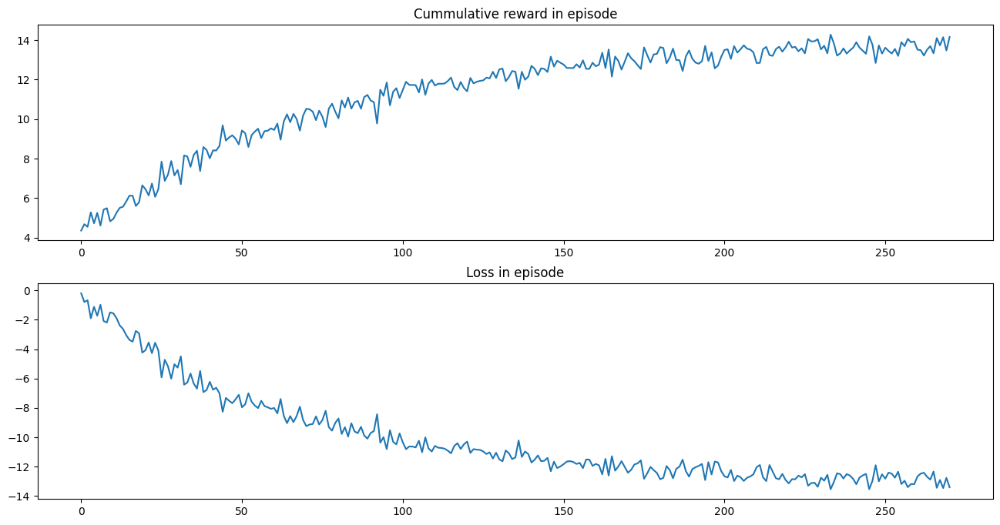

In [133]:
# plot losses and rewards
plt.figure(figsize=(16, 8))
plt.subplot(211)
plt.plot(rewards)
plt.title("Cummulative reward in episode")
plt.subplot(212)
plt.plot([x.cpu().detach().numpy() for x in losses])
plt.title("Loss in episode")
plt.show()

In [ ]:
# plot cummulative returns

plt.figure(figsize=(16, 8))
plt.plot(cum_returns)
plt.title("Cummulative returns on validation dataset")
plt.show()

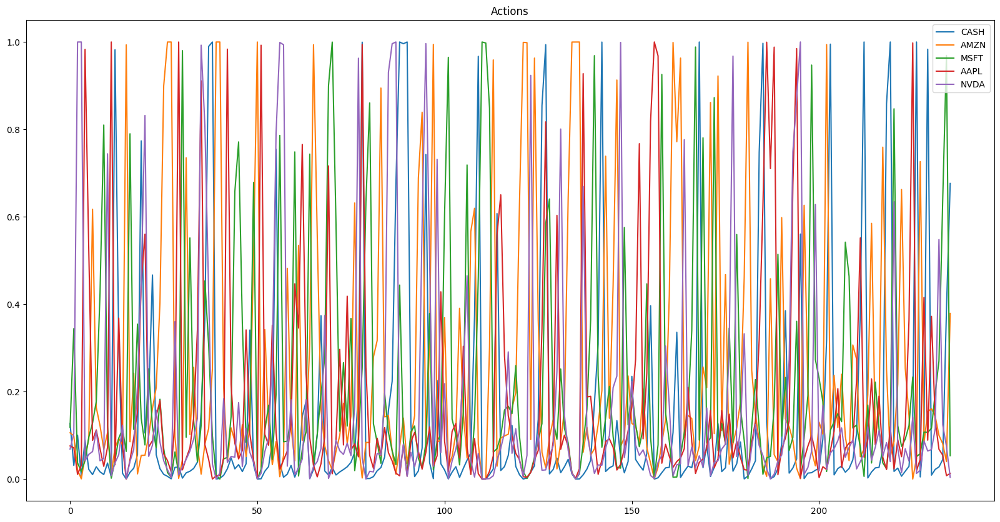

In [53]:
#plot actions

plt.figure(figsize=(20, 10))
# plt.plot(actions[-200:])
plt.plot(actions[-1])
# plt.plot(actions[:])
plt.title("Actions")
plt.legend(["CASH"] + tickers)
plt.show()

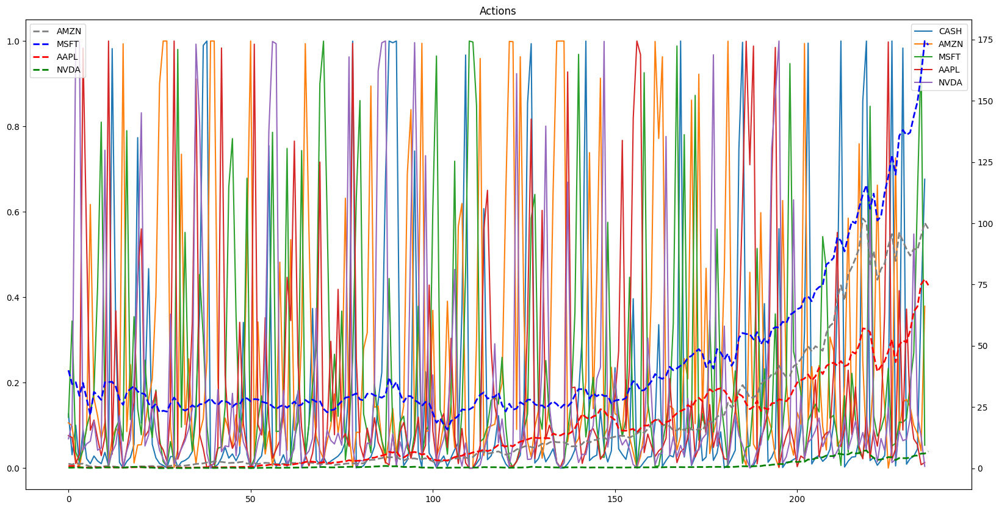

In [54]:
#plot actions
colours = ["gray", "blue", "red", "green", "purple", "orange"]
plt.figure(figsize=(20, 10))
plt.plot(actions[-1])
# plt.plot(actions[:])
plt.title("Actions")
plt.legend(["CASH"] + tickers)
plt.twinx()
x_range = range(0, len(train_df) - env.history_length)
for ticker in tickers:
    plt.plot(x_range, train_df[ticker]["Close"][env.history_length:], linewidth=2, linestyle="--", color=colours[tickers.index(ticker)], label=ticker)
plt.legend(tickers)
plt.show()


In [122]:
torch.save(model, "tmp.pth")

In [152]:
loaded_model = torch.load("tmp.pth")
loaded_model.eval()

Agent(
  (dense1): Linear(in_features=288, out_features=2048, bias=True)
  (dense2): Linear(in_features=2048, out_features=1024, bias=True)
  (dense3): Linear(in_features=1024, out_features=512, bias=True)
  (dense4): Linear(in_features=512, out_features=256, bias=True)
  (dense5): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=5, bias=True)
)

In [153]:
def deploy_policy_network(env, policy_net, device):
    state, _ = env.reset()
    done = False
    rewards = []
    actions = None
    while not done:
        state = torch.tensor(state, device=device, dtype=torch.float32)
        probs = policy_net(state)

        actions = probs.cpu().squeeze().detach().numpy()
        
        # print(actions)
        next_state, reward, done, _, _ = env.step(actions)
        # untensor
        state = next_state
        rewards.append(reward)

    return rewards

In [154]:
val_env = StockMarketEnv(data=val_df, initial_capital=10000, history_length=12)

# val_env.evaluate_for_constant_allocation([0, 1, 1, 1])
val_env.evaluate_for_constant_allocation([0, 1])
policy_gains = deploy_policy_network(val_env, loaded_model, "cuda")
val_env.render()
val_env.get_portfolio_value()

Portfolio Value: 10000.0, Portfolio Value End: 18614.839904785156
Percent change: 86.15%
Timestep: 59
Prices: [178.22000122 415.5        179.66000366  82.27899933]
Portfolio: [  0.  17.   9.  29. 315.]
Portfolio ratios: [0.053134767710526304, 0.08299987240557552, 0.115196806865309, 0.16430516412395263, 0.5843633888946366]
Capital: 2371.161816596985
Total Value: 40268.42673206329
Increase: 302.68%


(40268.42673206329, 3.026842673206329)

In [138]:
# calculate baseline gains

def deploy_baseline(env):
    state, _ = env.reset()
    done = False
    rewards = []
    actions = None
    # buy stocks
    actions = [0] + [1] * (env.num_stocks)
    next_state, reward, done, _, _ = env.step(actions)
    rewards.append(reward)
    while not done:
        # and hold
        next_state, reward, done, _, _ = env.step(action=actions, skip_reallocation=False)
        rewards.append(reward)

    return rewards

In [139]:
baseline_env = StockMarketEnv(data=val_df, initial_capital=10000, history_length=12)
baseline_gains = deploy_baseline(baseline_env)
mean_baseline_gains = np.mean(baseline_gains)
_, cummulatie_returns = val_env.get_portfolio_value()

baseline_env.render()


Timestep: 59
Prices: [178.22000122 415.5        179.66000366  82.27899933]
Portfolio: [  0.  57.  22.  49. 146.]
Portfolio ratios: [0.0, 0.25, 0.25, 0.25, 0.25]
Capital: 521.6202049255375
Total Value: 40637.234355926514
Increase: 306.37%


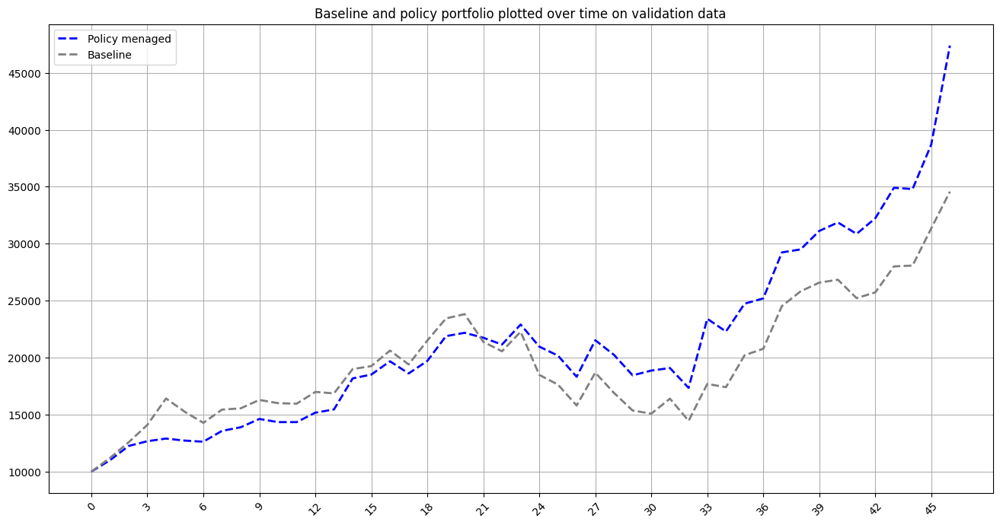

0.09187656423861797 0.16998580213944353


In [117]:
# calculate max drowdown
max_drodown = 0
max_drawdown_baseline = 0

portfolio_values = [val_env.initial_capital]
baseline_portfolio_values = [val_env.initial_capital]

for i in range(1, len(val_env.portfolio_gains)):
    portfolio_values.append(portfolio_values[-1] * (1 + val_env.portfolio_gains[i]))
    baseline_portfolio_values.append(baseline_portfolio_values[-1] * (1 + baseline_gains[i]))

    if portfolio_values[i] < portfolio_values[i - 1]:
        max_drodown = max(max_drodown, (portfolio_values[i - 1] - portfolio_values[i]) / portfolio_values[i - 1])

    if baseline_portfolio_values[i] < baseline_portfolio_values[i - 1]:
        max_drawdown_baseline = max(max_drawdown_baseline, (baseline_portfolio_values[i - 1] - baseline_portfolio_values[i]) / baseline_portfolio_values[i - 1])

# plot

plt.figure(figsize=(16, 8))
plt.plot(portfolio_values, linewidth=2, linestyle="--", color="blue", label="Policy menaged")
plt.plot(baseline_portfolio_values, linewidth=2, linestyle="--", color="gray", label="Baseline")
plt.title("Baseline and policy portfolio plotted over time on validation data")
# add max drawdown
plt.xticks(range(0, len(portfolio_values), 3), rotation=45)
plt.grid()
plt.legend()
plt.show()

print(max_drodown, max_drawdown_baseline)

In [178]:
import yfinance as yf
SP500 = yf.Ticker("^GSPC")

SP500_df = SP500.history(start=val_start_date, end=val_end_date, interval="1mo")
sp500_gains = SP500_df["Close"].pct_change()

sharpe_ratio_sp500 = (np.mean(sp500_gains - 0.0505 / 12)) / np.std(sp500_gains)
print(sharpe_ratio_sp500)

0.19682014658550195


In [172]:
sharpe_ratio_baseline = (np.mean(baseline_gains) - (0.0505 / 12)) / np.std(baseline_gains)
print(sharpe_ratio_baseline)

0.32858582809371506


In [86]:
# calculate sharpe ratio

sharpe_ratio = (np.mean(val_env.portfolio_gains) - (0.0505 / 12)) / np.std(val_env.portfolio_gains)
print(sharpe_ratio)

0.4181212429919319


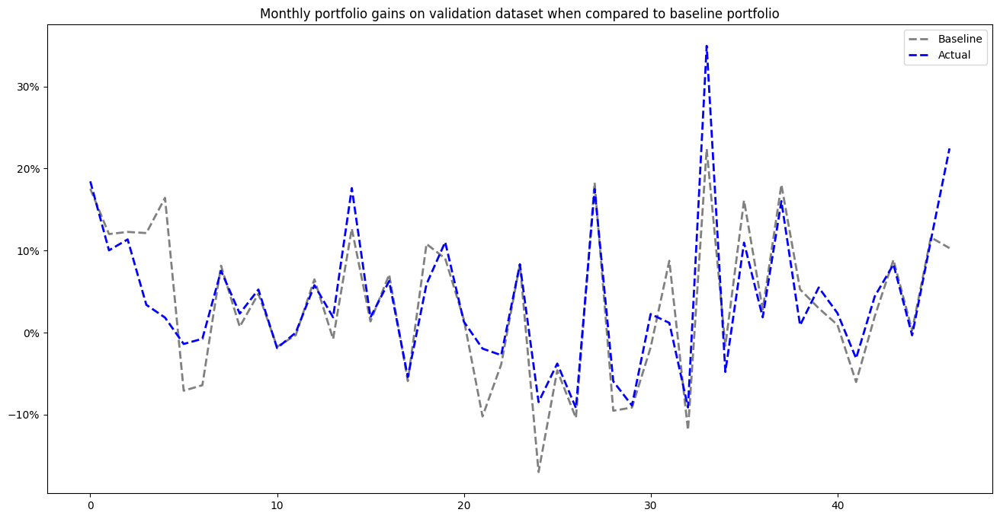

In [66]:
# polot portfolio gains baseline vs actual
# mean_baseline_gains = np.mean(baseline_gains, axis=1)

from matplotlib.ticker import PercentFormatter


plt.figure(figsize=(16, 8))
plt.plot(baseline_gains, linewidth=2, linestyle="--", color="gray", label="Baseline")
plt.plot(val_env.portfolio_gains, linewidth=2, linestyle="--", color="blue", label="Actual")
plt.title("Monthly portfolio gains on validation dataset when compared to baseline portfolio")
# make y axis percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.show()

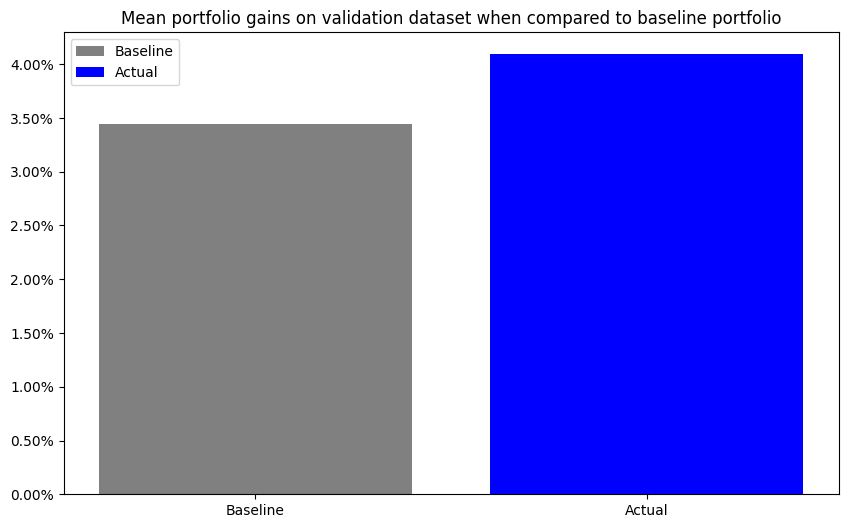

In [118]:
# bar plot for mean portfolio and baseline gains

plt.figure(figsize=(10, 6))
plt.bar("Baseline", np.mean(mean_baseline_gains), color="gray", label="Baseline")
plt.bar("Actual", np.mean(val_env.portfolio_gains), color="blue", label="Actual")
plt.title("Mean portfolio gains on validation dataset when compared to baseline portfolio")
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.legend()
plt.show()

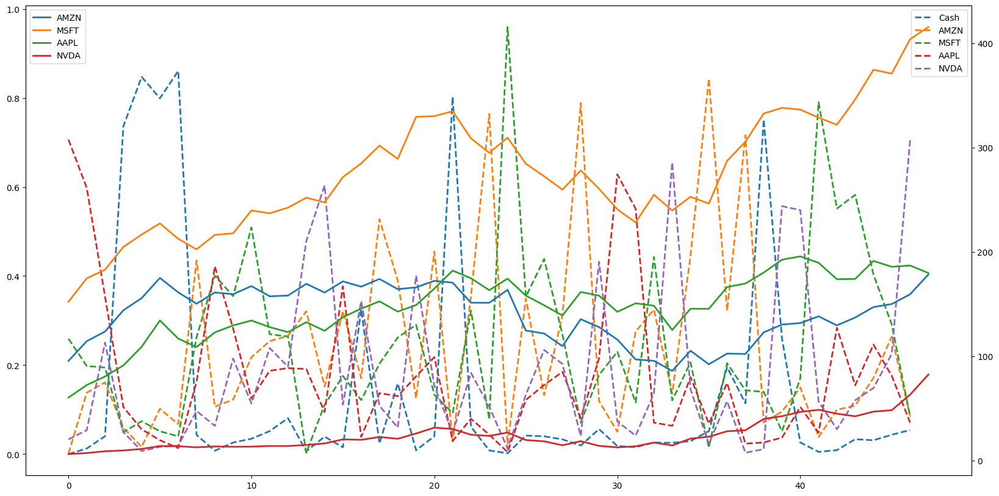

In [119]:
# plot allocations and sotck prices

x_range = range(0, len(val_env.portfolio_ratios) + 1)
plt.figure(figsize=(20, 10))
plt.plot(val_env.portfolio_ratios, linewidth=2, linestyle="--", label="Portfolio",)
plt.legend(["Cash"] + tickers)

plt.twinx()
for ticker in tickers:
    plt.plot(x_range, val_df[ticker]["Close"][val_env.history_length:], linewidth=2, linestyle="-", label=ticker)

plt.legend(tickers)
plt.show()